# Symulacje - notes
# 

In [4]:
using Plots
using StatsBase
using Distributions
using StatsFuns
using KernelDensity
using Statistics
using StatsPlots
using LaTeXStrings
using CSV
using DataFrames

## 01.03.2022

## 
## Lista 7

### Zadanie 1

In [2]:
function Poisson_procces(t, λ)
    S = 0
    Tn = Float64[]
    while S < t
        T = rand(Exponential(λ))
        S += T
        append!(Tn, S)
    end
    plot(Tn, 1:length(Tn), line=:steppre, legend=false)
end

Poisson_procces (generic function with 1 method)

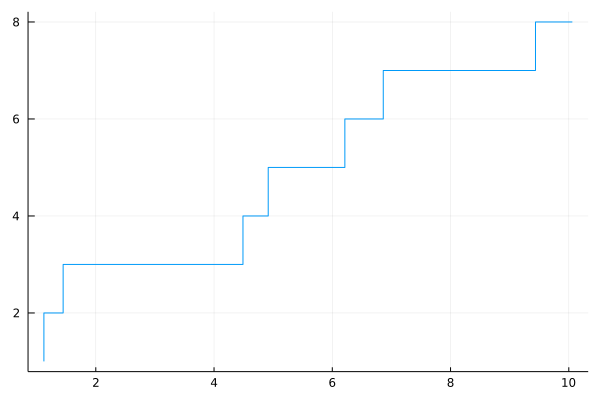

In [138]:
Poisson_procces(10, 1)

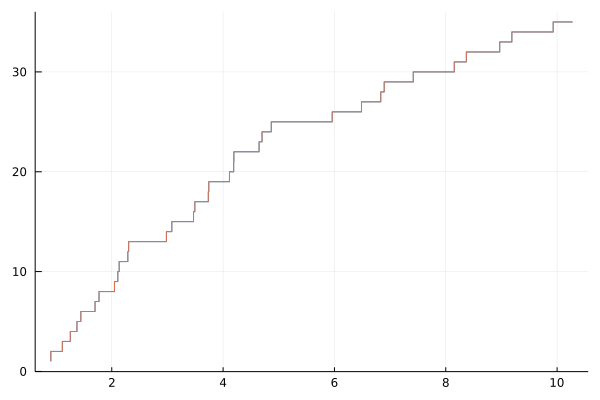

In [12]:
t = 10
λ = 1/3
S = 0
Tn = Float64[]
while S < t
    T = rand(Exponential(λ))
    S += T
    append!(Tn, S)
end
plot(Tn, 1:length(Tn), line=:steppre, legend=false)

F = ecdf(Tn)
plot!(Tn, F.(Tn).*length(Tn), line=:steppre)

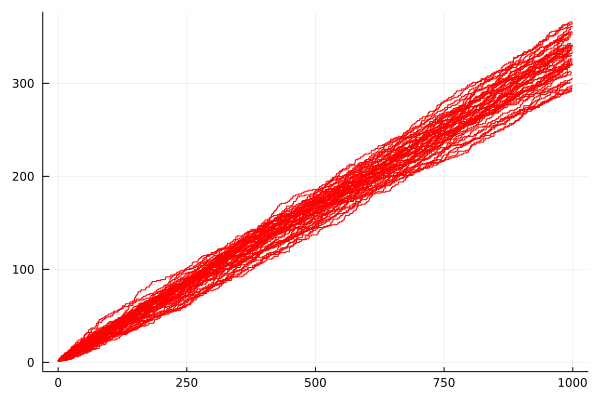

In [52]:
T = 1000
λ = 1/3
N = rand(Poisson(λ*T))
S = sort(rand(Uniform(0, T), N))
plt = plot(S, 1:length(S), line=:steppre, legend=false, color="red")

for i in 1:50
    N = rand(Poisson(λ*T))
    S = sort(rand(Uniform(0, T), N))
    plt = plot!(S, 1:length(S), line=:steppre, color="red")
end

plt |> display

## 
## Lista 8

### Zadanie 1

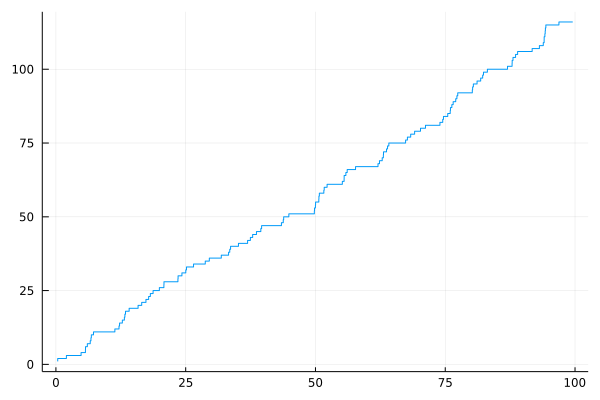

In [252]:
λ_(t) = 1 + cos(t)
λm = 2
T = 100
N = rand(Poisson(λm*T))
S = sort(rand(Uniform(0, T), N))
S = [s for s in S if rand()<λ_(s)/λm]
plot(S, 1:length(S), line=:steppre, legend=false)

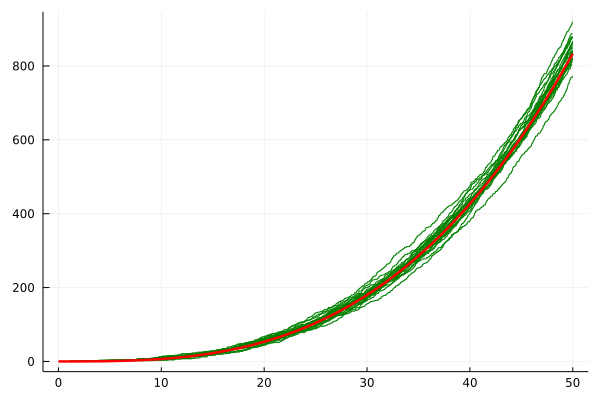

In [260]:
λ_(t) = 1/50 * t^2
λm = λ_(T)
T = 50
λ = 1/3
N = rand(Poisson(λm*T))
S = sort(rand(Uniform(0, T), N))
S = [s for s in S if rand()<λ_(s)/λm]
plt = plot(S, 1:length(S), line=:steppre, legend=false, color="green")

for i in 1:20
    N = rand(Poisson(λm*T))
    S = sort(rand(Uniform(0, T), N))
    S = [s for s in S if rand()<λ_(s)/λm]
    plt = plot!(S, 1:length(S), line=:steppre, legend=false, color="green")
end

f(x) = (x^3)/150
xs = 0:0.01:50
plot!(xs, f.(xs), color="red", linewidth=2.5)

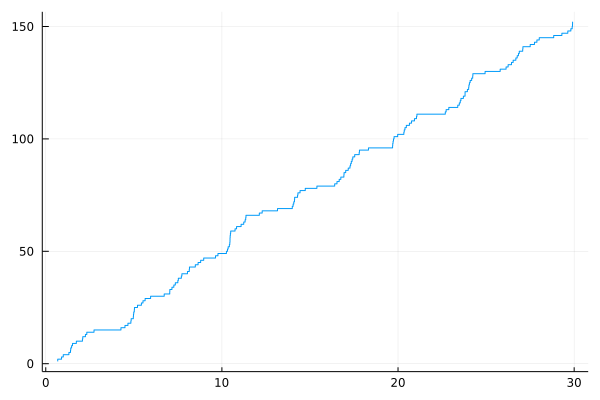

In [247]:
λ_(t) = 10*sin(t)^2
λm = 10
T = 30
N = rand(Poisson(λm*T))
S = sort(rand(Uniform(0, T), N))
S = [s for s in S if rand()<λ_(s)/λm]
plot(S, 1:length(S), line=:steppre, legend=false)

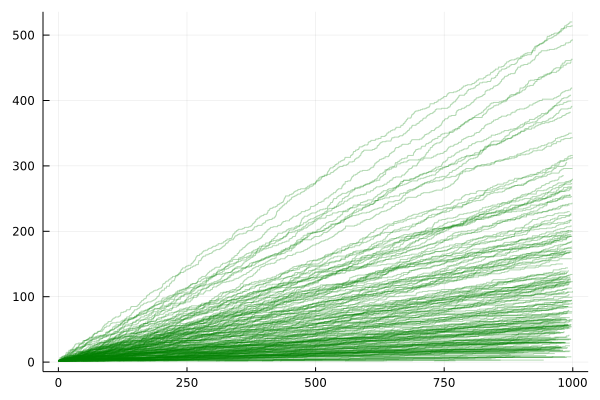

In [92]:
λ = 100
T = 1000

plot()
for i in 1:200
    Λ = rand(Exponential(λ))
    n = rand(Poisson(Λ))
    S = sort(rand(Uniform(0, T), n))
    plot!(S, 1:length(S), line=:steppre, legend=false, color="green", alpha=0.3)
end

plot!() |> display

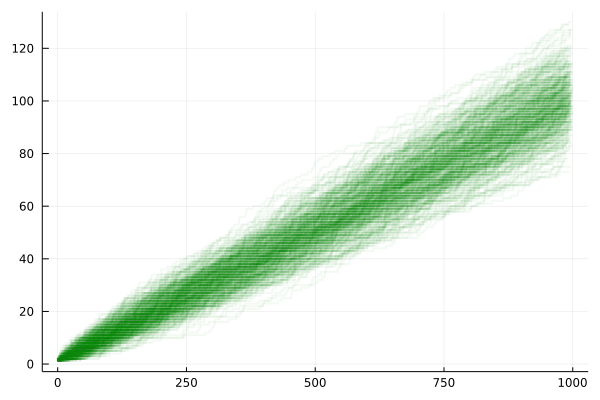

In [110]:
λ = 100
T = 1000

plot()
for i in 1:400
    Λ = rand(Normal(100, 1))
    n = rand(Poisson(Λ))
    S = sort(rand(Uniform(0, T), n))
    plot!(S, 1:length(S), line=:steppre, legend=false, color="green", alpha=0.05, width=2)
end

plot!() |> display

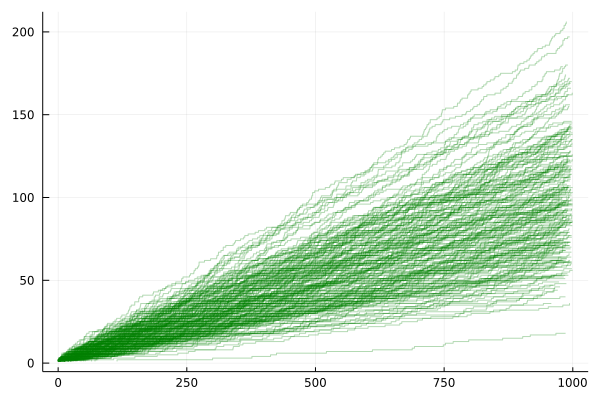

In [105]:
T = 1000
α = 10
β = 10

plot()
for i in 1:200
    Λ = rand(Gamma(α, β))
    n = rand(Poisson(Λ))
    S = sort(rand(Uniform(0, T), n))
    plot!(S, 1:length(S), line=:steppre, legend=false, color="green", alpha=0.3)
end

plot!() |> display

# 

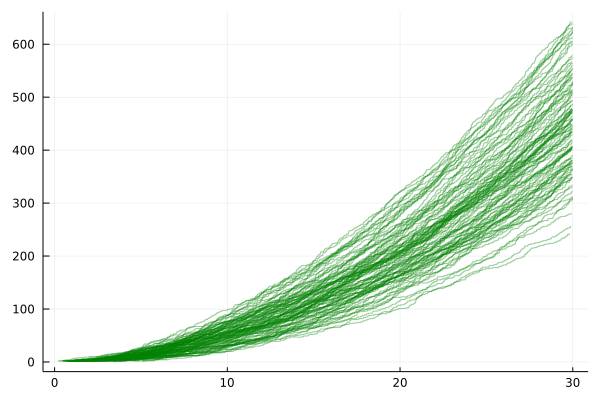

In [72]:
T = 30
λ = 1

plot()
for i in 1:100
    n = rand(Poisson(λ*T))
    Tn = sort(rand(Uniform(0, T), n))
    F = ecdf(Tn)
    Λ(t) = length(Tn) * F(t)
    #plot(Tn, Λ.(Tn), line=:steppre, legend=false) |> display

    λm = Λ(T)

    n = rand(Poisson(λm*T))
    S = sort(rand(Uniform(0, T), n))
    S = [s for s in S if rand()<Λ(s)/λm]
    plot!(S, 1:length(S), line=:steppre, legend=false, color="green", alpha=0.4)
end

plot!() |> display

## Proces ryzyka

In [3]:
function heaviside(t, x0)
   return 0.5 * (sign(t - x0) + 1)
end

heaviside (generic function with 1 method)

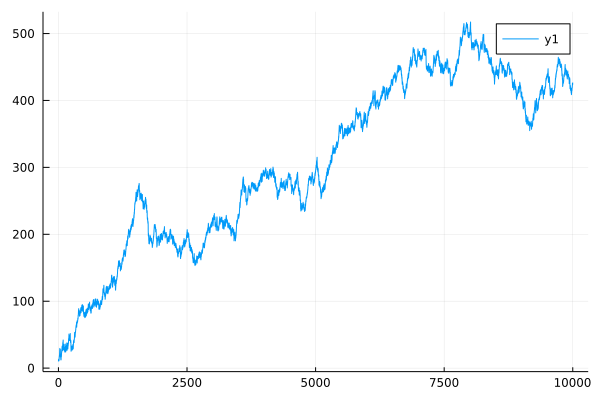

In [207]:
λ = 2
β = 1
θ = 0.01
T = 10000
u = 10
c = (1 + θ) * λ/β

n = rand(Poisson(λ*T))
τ = rand(Uniform(0, T), n)
X = rand(Exponential(1/β), n)
R(t) = u + c*t - sum(X .* heaviside.(t, τ))

xs = 0:1:T
plot(xs, R.(xs))

In [22]:
function Ψ(u, N)
    β1 = 1
    β2 = 2
    u = 10
    Z = 0
    p = 1/3
    θ = 0.2
    for i in 1:N
        K = rand(Geometric(θ/(1 + θ)))
        k = rand(Binomial(K, p))
        Y1 = rand(Exponential(1/β1), k)
        Y2 = rand(Exponential(1/β2), K - k)
        Y = vcat(Y1, Y2)
        if sum(Y) > u
            Z += 1
        end
    end

    return Z/N
end

Ψ(10, 1000)

0.068

## Ruch Browna

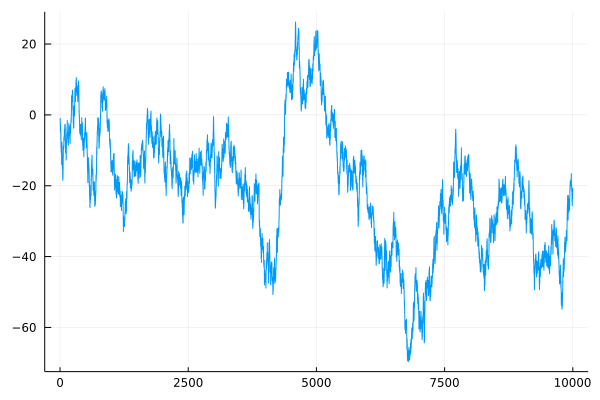

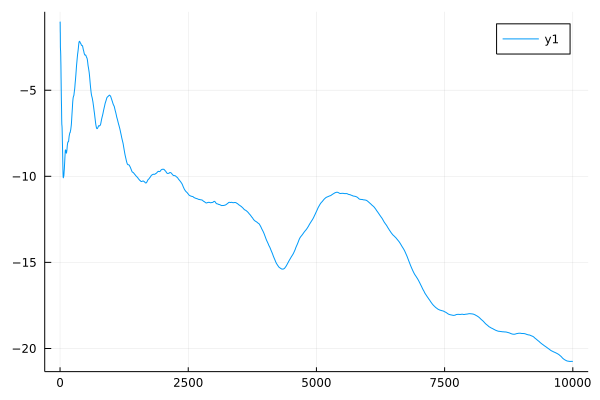

In [211]:
Δ = 1
T = 10000
X = rand(Normal(0, sqrt(Δ)), T)
B = cumsum(X)
plot(Δ:Δ:T, B, legend=false) |> display
plot(Δ:Δ:T, cumsum(B)./(Δ:Δ:T))

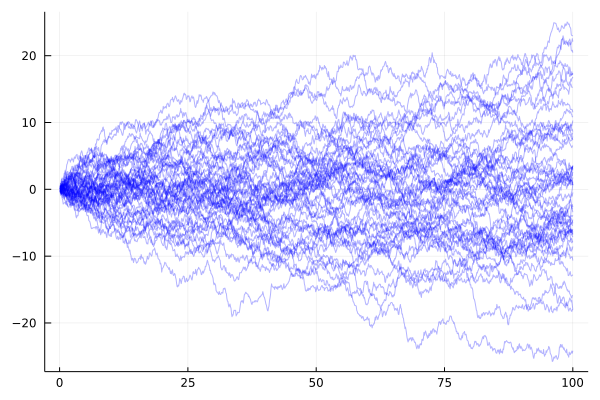

In [160]:
Δ = 0.1
T = 100
plot()
for i in 1:50
    X = rand(Normal(0, sqrt(Δ)), 1000)
    B = cumsum(X)
    plot!(Δ:Δ:T, B, legend=false, color="blue", alpha=0.3)
end
plot!()

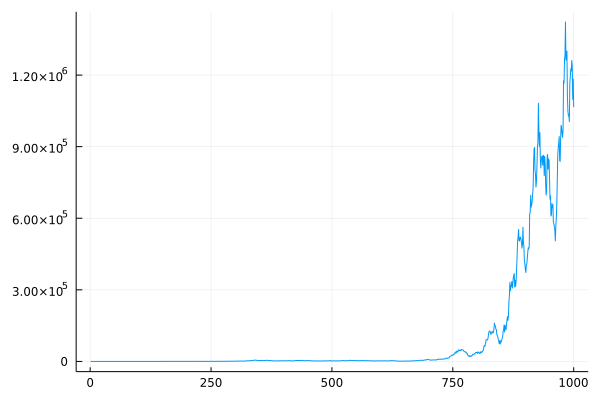

In [72]:
μ = 0.01
σ = 0.1
S0 = 10

Δ = 1
T = 1000
X = rand(Normal(0, sqrt(Δ)), T)
B = cumsum(X)
ts = Δ:Δ:T
S = S0 .* exp.(μ.*ts .+ σ.*B)
plot(Δ:Δ:T, S, legend=false)

In [209]:
μ = 0.01
σ = 0.1
S0 = 10

K = 1
r = 0.01

Δ = 1
T = 1000

result = 0
for i in 1:1000
    X = rand(Normal(0, sqrt(Δ)), T)
    B = cumsum(X)
    ts = Δ:Δ:T
    S = S0 .* exp.(μ.*ts .+ σ.*B)
    result += maximum([S[T] - K, 0]) * exp(-r*T)
end

result/1000
#plot(Δ:Δ:T, S, legend=false)

834.7303928246566

## 
## 
## Raport

In [1]:
using Plots
using StatsBase
using Distributions
using StatsFuns
using KernelDensity
using Statistics
using StatsPlots
using LaTeXStrings
using CSV
using DataFrames

In [2]:
file = open("data.txt")
lines = readlines(file)
close(file)

In [3]:
data = parse.(Float64, lines)
data = reshape(data, (10001, 50))

10001×50 Matrix{Float64}:
   50.0      50.0      50.0       50.0     …    50.0       50.0       50.0
   50.5625   50.5625   50.5625    50.5625       50.5625    50.5625    50.5625
   51.125    51.125    51.125     51.125        51.125     51.125     51.125
   51.6875   51.6875   51.6875    51.6875       51.6875    51.6875    51.6875
   52.25     52.25     52.25      52.25         52.25      52.25      52.25
   52.8125   52.8125   52.8125    52.8125  …    52.8125    52.8125    52.8125
   53.375    53.375    53.375     53.375        53.375     53.375     53.375
   53.9375   53.9375   53.9375    53.9375       53.9375    53.9375    53.9375
   54.5      54.5      54.5       54.5          54.5       54.5       54.5
   55.0625   55.0625   55.0625    55.0625       55.0625    55.0625    55.0625
   55.625    55.625    55.625     55.625   …    55.625     55.625     55.625
   56.1875   56.1875   56.1875    56.1875       56.1875    56.1875    56.1875
   27.5536   56.75     56.75      56.75         5

In [4]:
plot()
for i in 1:50
    R = data[:,i]
    plot!(0:0.01:100, R, legend=false)
end

plot!()


(process:17892): GLib-GIO-WARNING **: 20:06:31.715: Unexpectedly, UWP app `NightRise.NotepadWrapped_7.59.32.0_x64__bahp16nyyek9m' (AUMId `NightRise.NotepadWrapped_bahp16nyyek9m!NotepadWrapped') supports 89 extensions but has no verbs

(process:17892): GLib-GIO-WARNING **: 20:06:32.366: Unexpectedly, UWP app `Microsoft.ZuneVideo_10.22041.10091.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ZuneVideo_8wekyb3d8bbwe!Microsoft.ZuneVideo') supports 33 extensions but has no verbs


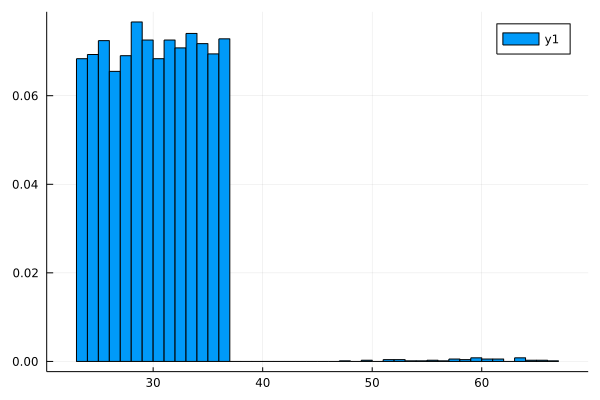

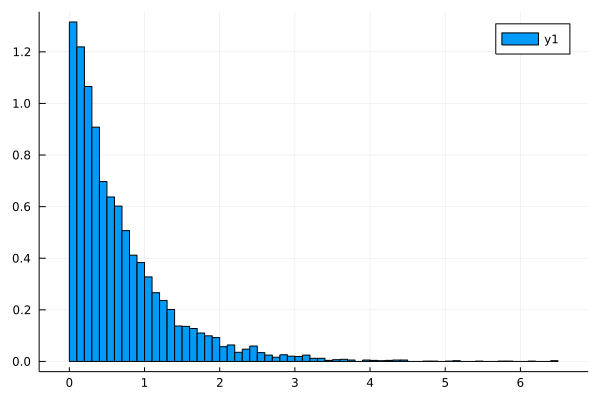

In [45]:
X = Float64[]
T = Float64[]

for col in 1:50
    τ = 0
    for i in 2:10001
        Δ = data[i-1, col] - data[i, col]
        τ += 1
        if Δ > 0
            append!(X, Δ + 0.5625)
            append!(T, τ * 0.01)
            τ = 0
        end
    end
end

histogram(X, normed=true) |> display
histogram(T, normed=true)

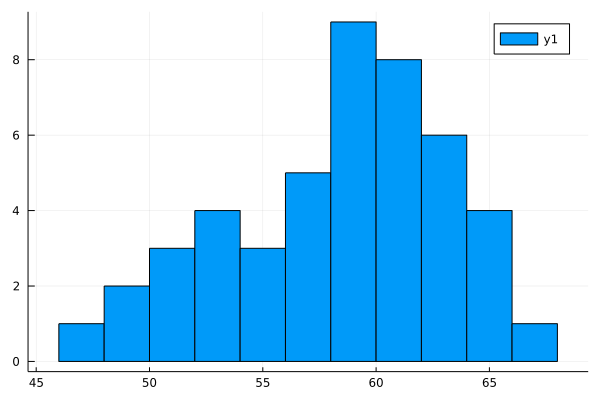

In [48]:
Y = [x for x in X if x > 40]
histogram(Y, bins=10)

In [23]:
X_data = CSV.read("Xi.csv", DataFrame)
Xi = X_data.X

T_data = CSV.read("Ti.csv", DataFrame)
Ti = T_data.T

7358-element Vector{Float64}:
 0.11999999999999998
 0.34000000000000014
 0.9600000000000006
 0.9800000000000006
 1.1900000000000008
 1.9700000000000015
 0.18000000000000002
 0.19000000000000003
 1.7000000000000013
 0.9800000000000006
 1.1600000000000008
 0.060000000000000005
 0.6800000000000004
 ⋮
 0.4000000000000002
 0.8800000000000006
 0.7700000000000005
 1.7800000000000014
 0.5300000000000002
 0.05
 0.09
 0.13999999999999999
 0.49000000000000027
 0.8500000000000005
 0.7800000000000005
 1.440000000000001

In [26]:
Ti

7358-element Vector{Float64}:
 0.11999999999999998
 0.34000000000000014
 0.9600000000000006
 0.9800000000000006
 1.1900000000000008
 1.9700000000000015
 0.18000000000000002
 0.19000000000000003
 1.7000000000000013
 0.9800000000000006
 1.1600000000000008
 0.060000000000000005
 0.6800000000000004
 ⋮
 0.4000000000000002
 0.8800000000000006
 0.7700000000000005
 1.7800000000000014
 0.5300000000000002
 0.05
 0.09
 0.13999999999999999
 0.49000000000000027
 0.8500000000000005
 0.7800000000000005
 1.440000000000001

In [24]:
sum(Ti)

4967.549999999996

In [43]:
c = (data[2, 1] - data[1, 1]) * 100
μ = mean(Xi)
λ = 1/mean(Ti)
θ = c / (μ * λ) - 1

println("c = ", c)
println("μ = ", μ)
println("λ = ", λ)
println("θ = ", θ)

c = 56.25
μ = 30.231343882787424
λ = 1.4812130728427506
θ = 0.25616745367375415


In [44]:
function heaviside(t, x0)
    return 0.5 * (sign(t - x0) + 1)
end


heaviside (generic function with 1 method)

In [ ]:
T = 100
u = 50
c = (1 + θ) * μ * λ

n = rand(Poisson(λ*T))
τ = rand(Uniform(0, T), n)
X = rand()
R(t) = u + c*t - sum(X .* heaviside.(t, τ))

xs = 0:0.01:T
plot(xs, R.(xs))

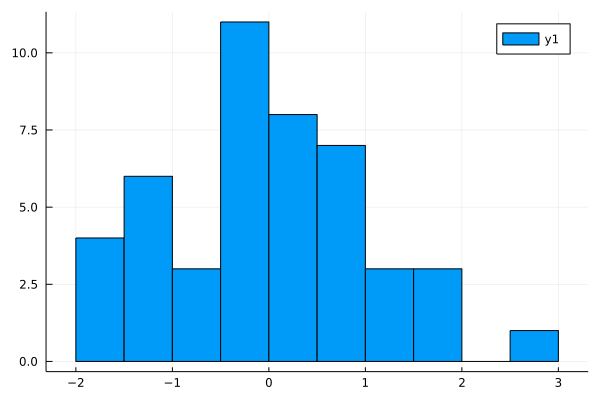

In [100]:
X = randn(46)
histogram(X, bins=10)